- `pip install insightface`
- `pip install opencv-python`
- `pip install -U matplotlib`
- `pip install numpy`

- [model file](https://huggingface.co/deepinsight/inswapper/tree/main)
- [model alternative file](https://drive.google.com/file/d/1krOLgjW2tAPaqV-Bw4YALz0xT5zlb5HF/view)

- [insightface library](https://github.com/deepinsight/insightface)
- [insightface website](https://insightface.ai/)

## Импорт требуемых библиотек

In [ ]:
import cv2
import insightface

import matplotlib.pyplot as plt
from insightface.app import FaceAnalysis
from insightface.data import get_image as ins_get_image

### Выставляем качество картинки для отображения и сохранения

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [ ]:
print('insightface', insightface.__version__)


In [ ]:
app = FaceAnalysis(name='buffalo_l')
app.prepare(ctx_id=0, det_size=(640, 640))

In [ ]:
img = ins_get_image('t1')
# Конвертируем из одного пространства цветов в другой 1 способом
plt.imshow(img[:,:,::-1])
plt.axis('off')
plt.show()

In [ ]:
# распознаем лица и записываем данные о них в переменную faces
faces = app.get(img)
# картинку на базе оригинальной, но с отрисованными областями на месте распознания лиц
rimg = app.draw_on(img, faces)
# сохраняем картинку
cv2.imwrite("./t1_output.jpg", rimg)

### Картинка с распознаными лицами

In [ ]:
img_r = cv2.imread('t1_output.jpg')
# Конвертируем из одного пространства цветов в другой 2 способом
img2 = cv2.cvtColor(img_r, cv2.COLOR_BGR2RGB) 
# отключаем отображение осей
plt.axis('off')
# отображаем график
plt.imshow(img2);

In [ ]:
faces[0]['bbox']

In [ ]:

# top:bottom, left:right. Начало координат с верхнего леого угла
plt.figure(figsize = (1,1))
plt.imshow(img[268:415, 466:573,::-1], aspect='equal')
plt.axis('off')
plt.show()

In [ ]:
fig, axs = plt.subplots(1,6, figsize = (4,1.5))

for i, face in enumerate(faces):
  bbox = face['bbox']
  bbox = [int(b) for b in bbox]
  axs[i].imshow(img[bbox[1]:bbox[3], bbox[0]:bbox[2],::-1])
  axs[i].axis('off')


In [ ]:
swapper = insightface.model_zoo.get_model('inswapper_128.onnx',
                                          download = True)

In [ ]:
source_face = faces[2]
bbox = source_face['bbox']
bbox = [int(b) for b in bbox]
plt.figure(figsize = (1,1))
plt.imshow(img[bbox[1]:bbox[3], bbox[0]:bbox[2],::-1], aspect='equal')
plt.axis('off')
plt.show()

In [ ]:
res = img.copy()
for face in faces:
  res = swapper.get(res, face, source_face)

In [ ]:
plt.imshow(res[:,:,::-1])
plt.axis('off')
plt.show()

In [ ]:
fig, axs = plt.subplots(2,6, figsize = (12,5))

for i, face in enumerate(faces):
  bbox = face['bbox']
  bbox = [int(b) for b in bbox]
  axs[0][i].imshow(img[bbox[1]:bbox[3], bbox[0]:bbox[2],::-1])
  axs[1][i].imshow(res[bbox[1]:bbox[3], bbox[0]:bbox[2],::-1])
  axs[0][i].axis('off')
  axs[1][i].axis('off')

In [ ]:
jackie = cv2.imread('3840x.webp')
plt.imshow(jackie[:,:,::-1])
plt.axis('off')
plt.show()

In [ ]:
jackie_face = app.get(jackie)[0]

res = img.copy()
for face in faces:
  res = swapper.get(res, face, jackie_face)
  
fig, ax = plt.subplots()
ax.imshow(res[:,:,::-1])
ax.axis('off')
plt.show();  

In [ ]:
guardians = cv2.imread('Guardians_of_the_Galaxy_Russian_Poster.webp')
plt.imshow(guardians[:,:,::-1])
plt.axis('off')
plt.show()

In [ ]:

faces = app.get(guardians)

res = guardians.copy()
for face in faces:
  res = swapper.get(res, face, jackie_face)
  
fig, ax = plt.subplots()
ax.imshow(res[:,:,::-1])
ax.axis('off')
plt.show();  

In [ ]:
def show_2_faces(img1, img2):
   fig,ax = plt.subplots(1,2,figsize = (10,5))
   ax[0].imshow(img1[:,:,::-1])
   ax[0].axis('off')
   ax[1].imshow(img2[:,:,::-1])
   ax[1].axis('off')
   plt.show();
  

def swap_face_2(img1_path, 
                img2_path, 
                app, 
                swapper):
  
  img1 = cv2.imread(img1_path) 
  img2 = cv2.imread(img2_path) 
 
  #  Показываем фото до изменения
  show_2_faces(img1, img2)
   
  #  получаем информацию о найденном лице
  face1 = app.get(img1)[0]
  face2 = app.get(img2)[0]
   
  img1_ = img1.copy()
  img2_ = img2.copy()
   
  # меняем лица
  img1_ = swapper.get(img1_, face1, face2)
  img2_ = swapper.get(img2_, face2, face1)
  # показывам результат замены лиц
  show_2_faces(img1_, img2_)

  
   

In [ ]:
swap_face_2('will_smith.jpg','scarlett.jpg', app, swapper)

In [ ]:
swap_face_2('will_smith.jpg','eisenberg.jpg', app, swapper)

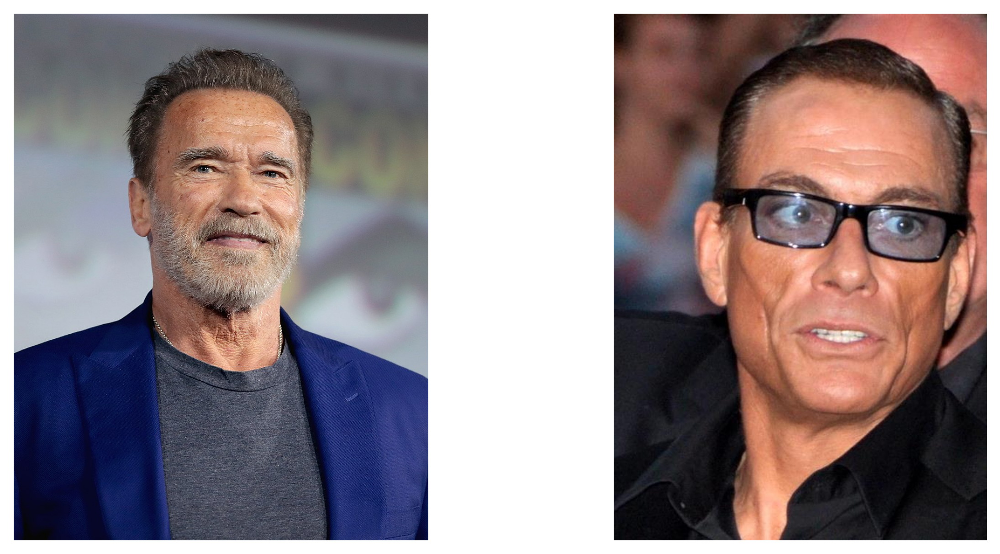

C:\Users\Andrew\AppData\Roaming\Python\Python311\site-packages\insightface\utils\transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


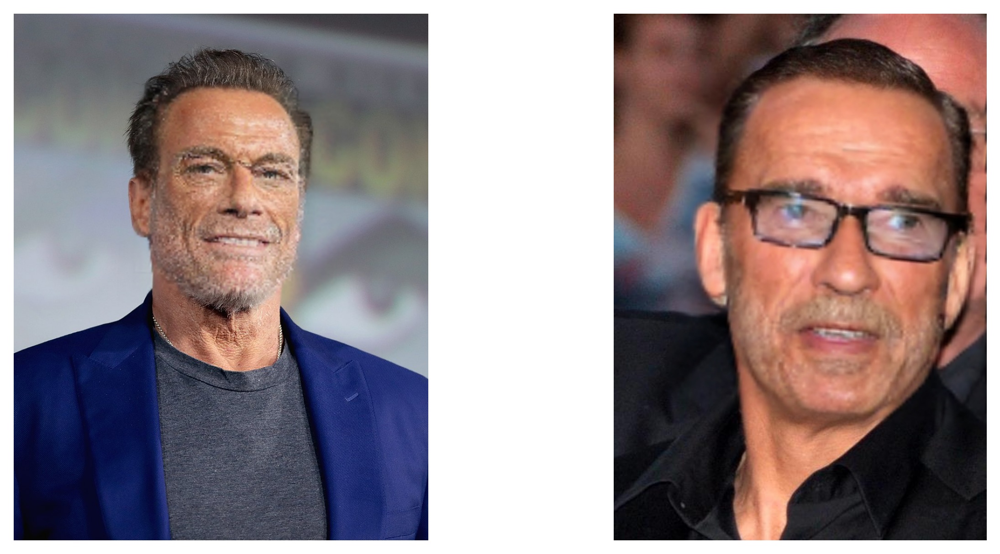

In [39]:
swap_face_2('848px-Arnold_Schwarzenegger_by_Gage_Skidmore_4.jpg','Jean-Claude_Van_Damme_2012.jpg', app, swapper)

In [ ]:
def show_face(img):
   plt.imshow(img[:,:,::-1])
   plt.axis('off')
   plt.show();

def swap_face_2_same_picture(img_path, 
                app, 
                swapper):
  
  img = cv2.imread(img_path) 
 
  show_face(img)
   
  #  получаем информацию о найденном лице
  face1 = app.get(img)[0]
  face2 = app.get(img)[1]
   
  img_ = img.copy()
   
  img_ = swapper.get(img_, face1, face2)
  img_ = swapper.get(img_, face2, face1)
  show_face(img_)

In [ ]:
swap_face_2_same_picture('couple1.1461', app, swapper)

In [ ]:
swap_face_2_same_picture('couple2.1376', app, swapper)

In [ ]:
swap_face_2_same_picture('couple3.1333', app, swapper)

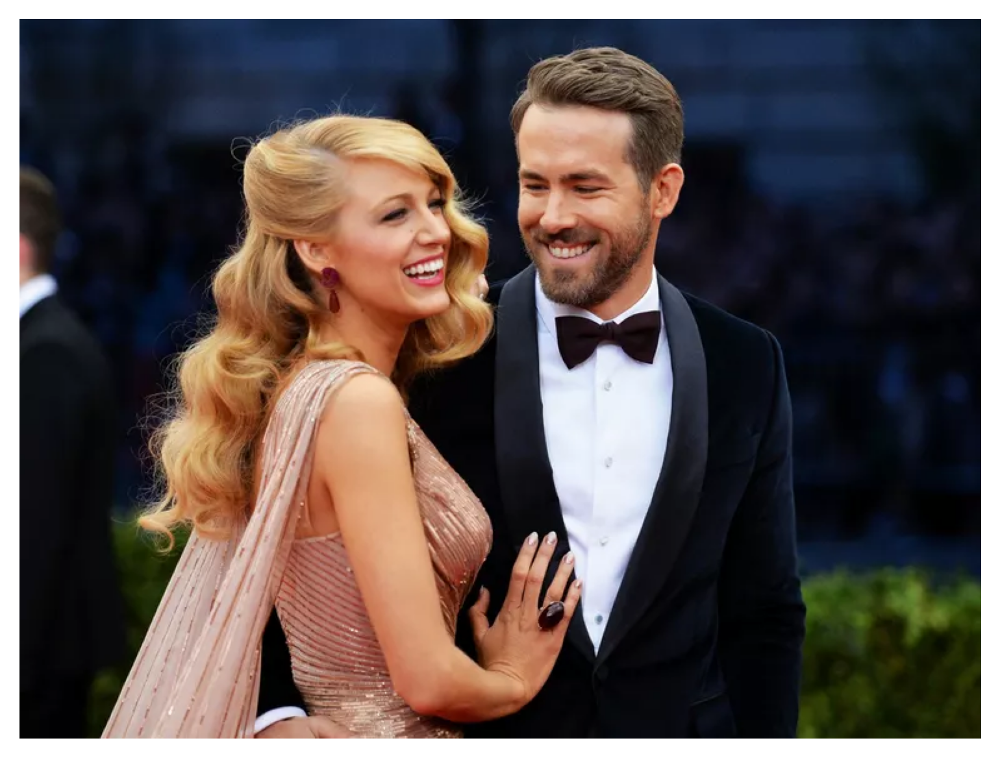

C:\Users\Andrew\AppData\Roaming\Python\Python311\site-packages\insightface\utils\transform.py:68: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  P = np.linalg.lstsq(X_homo, Y)[0].T # Affine matrix. 3 x 4


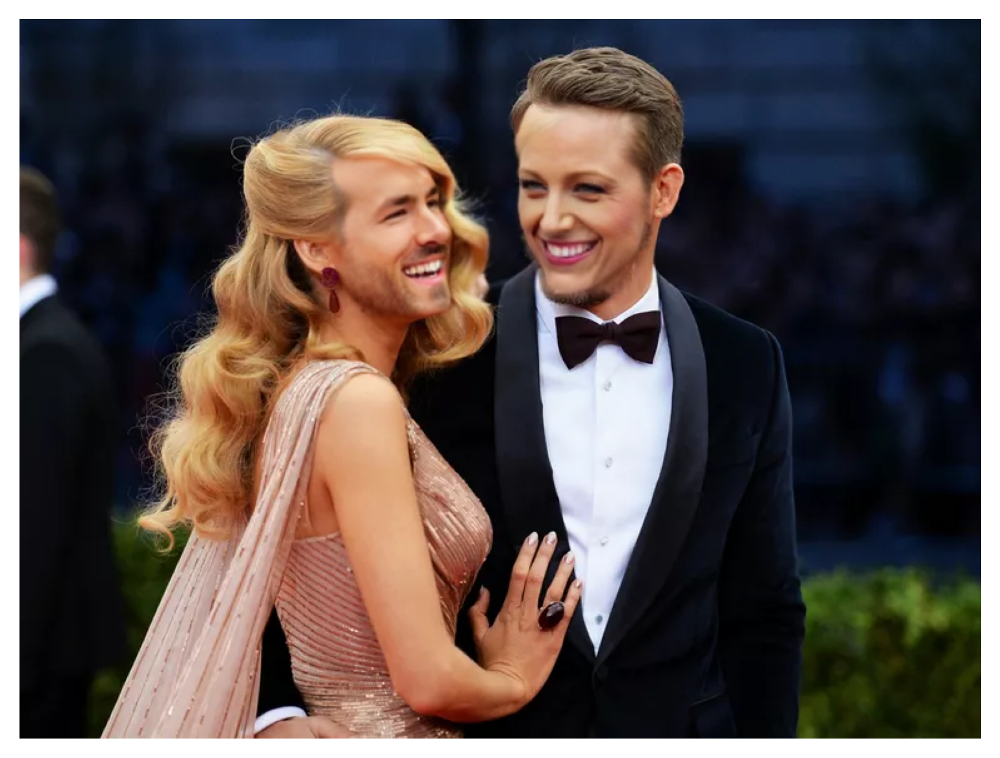

In [40]:
swap_face_2_same_picture('bec9aac8-f145-41c7-ae9f-a561670fd744~rs_768.h-cr_83.0.1918.1376', app, swapper)